# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [6]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [7]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [8]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - 1)**2)
    #### END CODE HERE ####
    return penalty

In [9]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [12]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -1. * torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [13]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [14]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = (torch.mean(crit_fake_pred) - torch.mean(crit_real_pred)) + (c_lambda * gp)
    #### END CODE HERE ####
    return crit_loss

In [15]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Epoch 1, step 500: Generator loss: 2.447914589648135, critic loss: -101.82157795228069


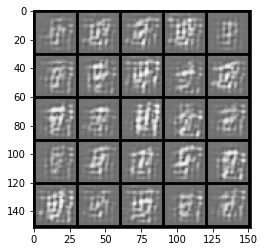

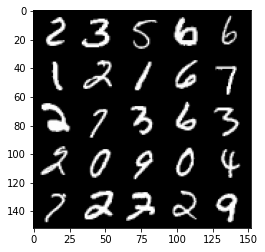

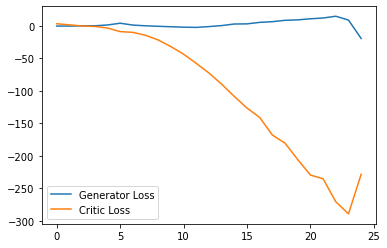

Epoch 2, step 1000: Generator loss: -15.799293565094471, critic loss: -214.888522389984


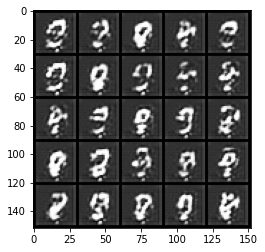

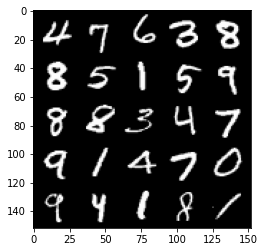

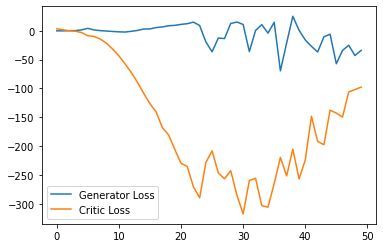

Epoch 3, step 1500: Generator loss: -4.108112871363759, critic loss: 13.909256794357303


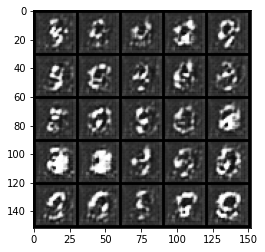

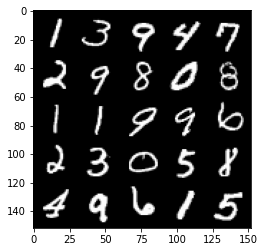

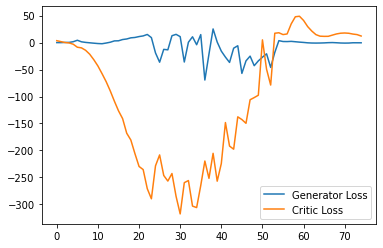

Epoch 4, step 2000: Generator loss: 0.26699260414764286, critic loss: 0.6955246682167037


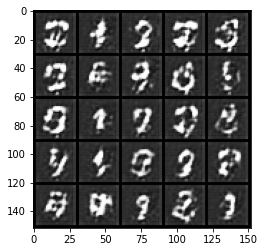

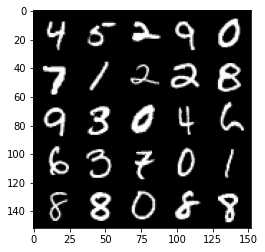

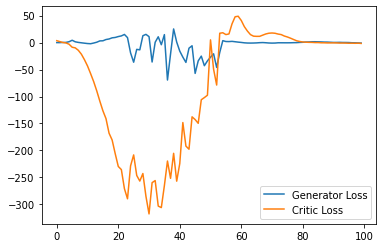

Epoch 5, step 2500: Generator loss: 2.379001775935292, critic loss: -14.783516421318062


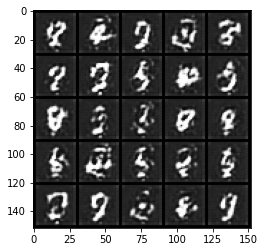

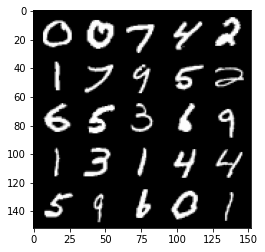

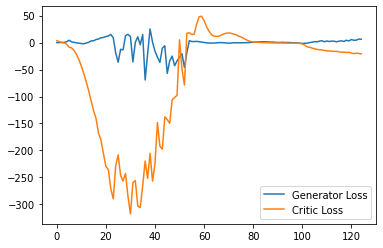

Epoch 6, step 3000: Generator loss: 6.865769394323229, critic loss: -14.012676173400886


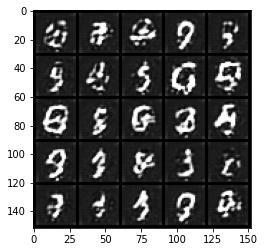

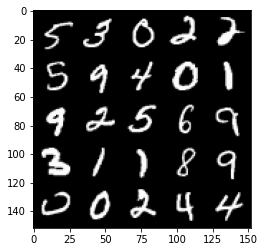

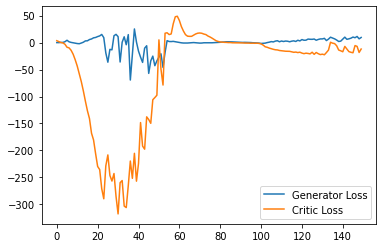

Epoch 7, step 3500: Generator loss: 13.145603604614735, critic loss: -11.290494765329358


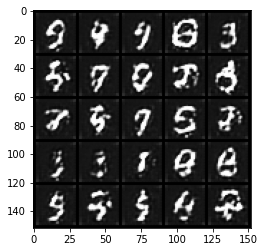

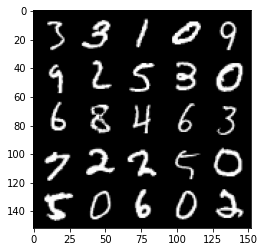

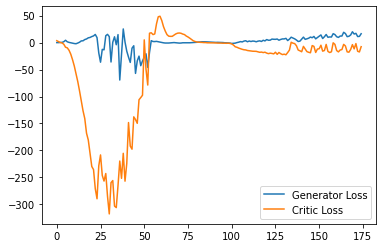

Epoch 8, step 4000: Generator loss: 14.94347234249115, critic loss: -8.024264780044554


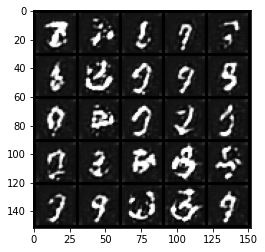

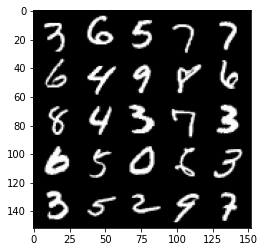

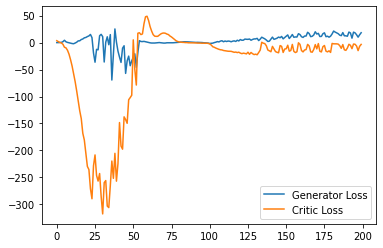

Epoch 9, step 4500: Generator loss: 15.968808031916618, critic loss: -8.212346345520011


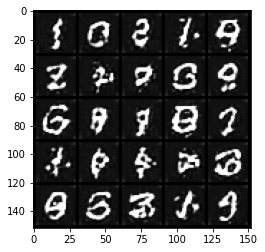

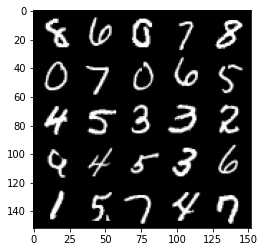

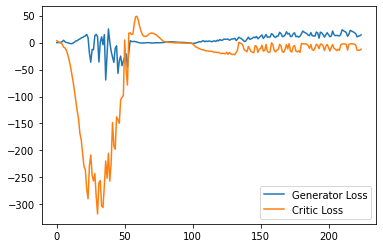

Epoch 10, step 5000: Generator loss: 19.69771238040924, critic loss: -4.389505352973938


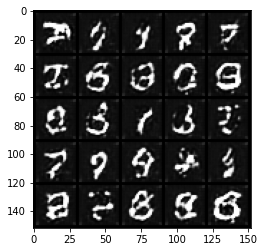

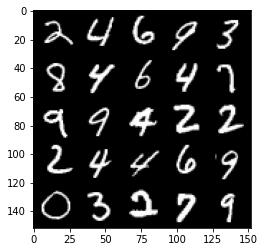

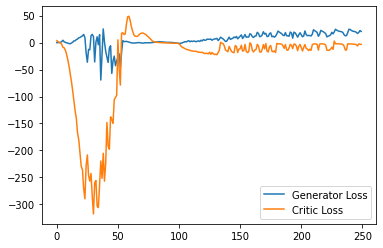

Epoch 11, step 5500: Generator loss: 18.81143167114258, critic loss: -8.461245728778842


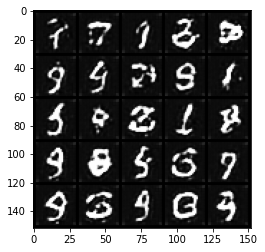

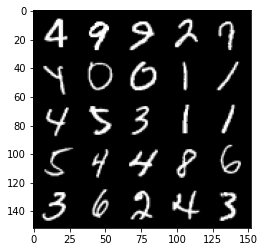

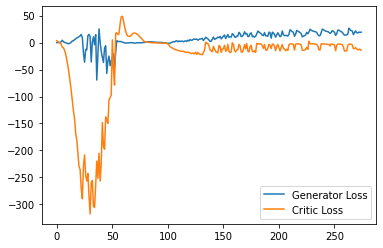

Epoch 12, step 6000: Generator loss: 23.410062088251113, critic loss: -9.057058085393908


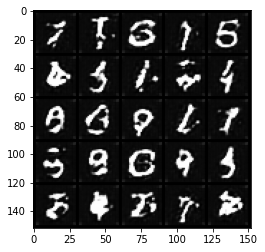

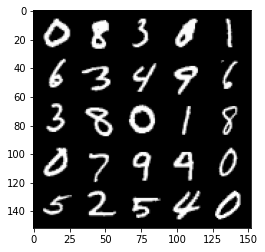

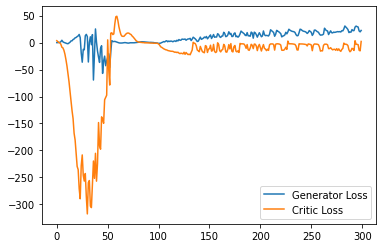

Epoch 13, step 6500: Generator loss: 24.27828829097748, critic loss: -5.509888026285168


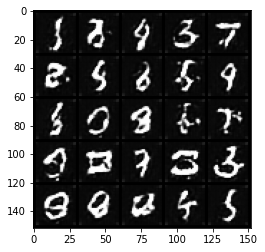

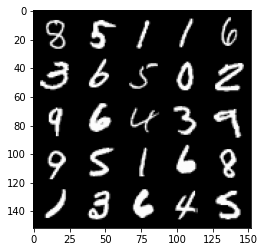

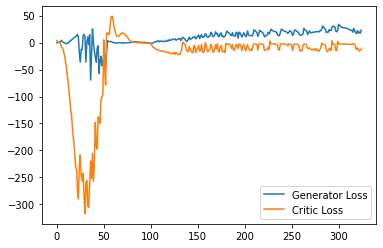

Epoch 14, step 7000: Generator loss: 27.262466773509978, critic loss: -10.475498842883121


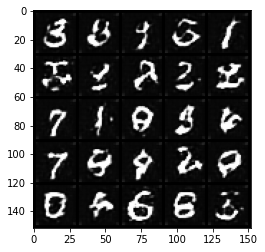

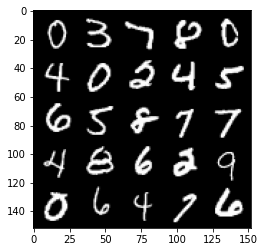

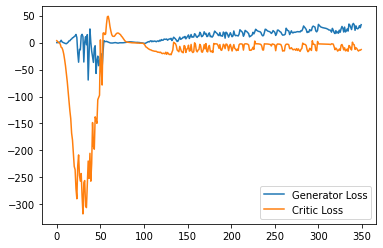

Epoch 15, step 7500: Generator loss: 33.65850745391846, critic loss: -13.127212693238262


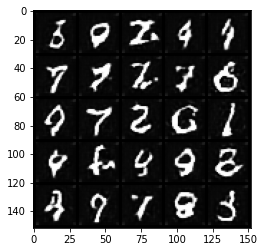

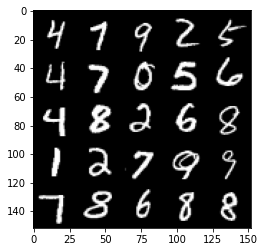

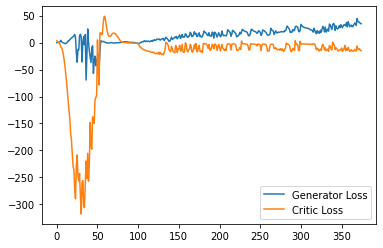

Epoch 17, step 8000: Generator loss: 40.09339335632324, critic loss: -10.67490811953545


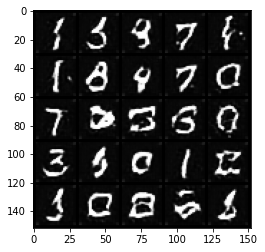

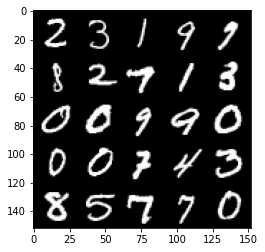

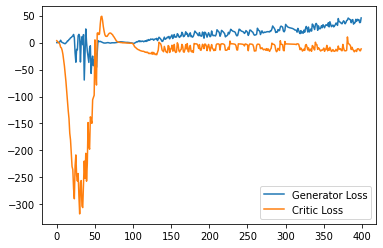

Epoch 18, step 8500: Generator loss: 44.54167349624634, critic loss: -11.772961792612074


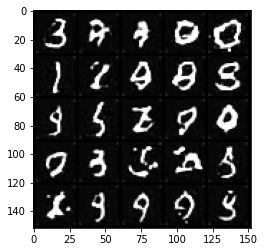

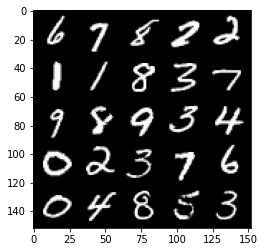

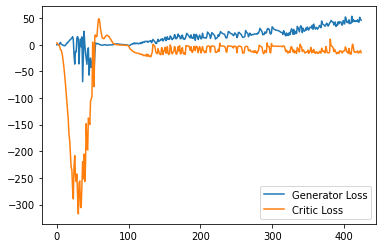

Epoch 19, step 9000: Generator loss: 48.80714450073242, critic loss: -13.316453125262251


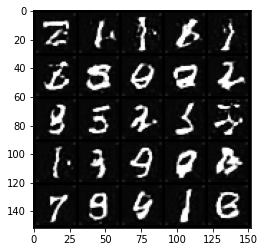

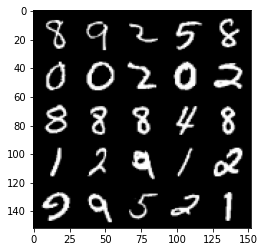

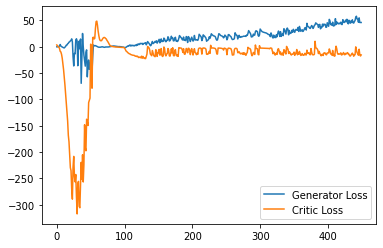

Epoch 20, step 9500: Generator loss: 55.77344536209107, critic loss: -10.930207024741177


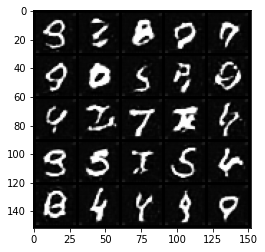

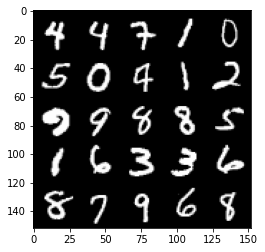

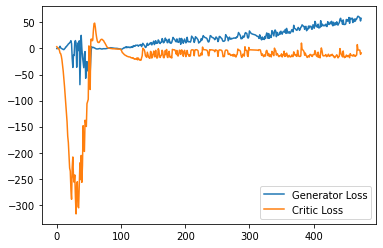

Epoch 21, step 10000: Generator loss: 57.32399439239502, critic loss: -12.43774385671615


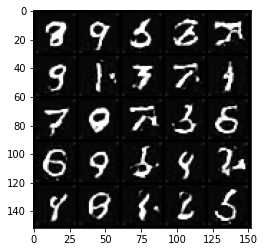

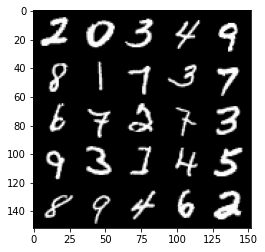

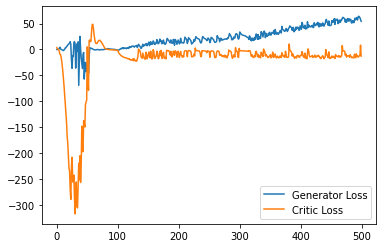

Epoch 22, step 10500: Generator loss: 63.67311806488037, critic loss: -11.752628930926322


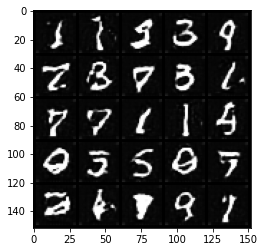

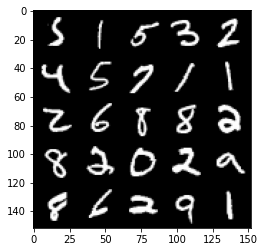

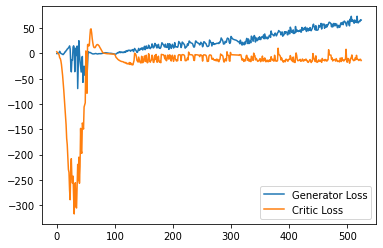

Epoch 23, step 11000: Generator loss: 66.59907269287109, critic loss: -10.524341892027861


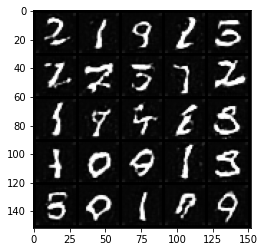

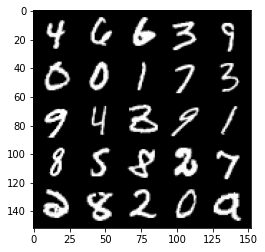

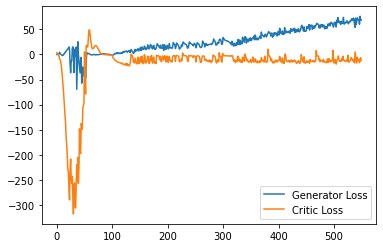

Epoch 24, step 11500: Generator loss: 69.58384182739258, critic loss: -12.823422060632696


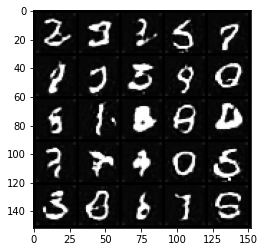

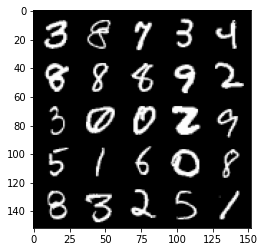

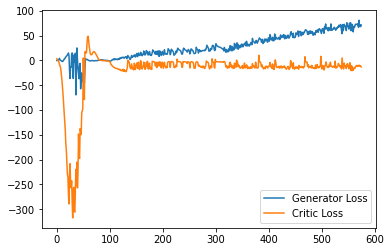

Epoch 25, step 12000: Generator loss: 73.86934896850586, critic loss: -11.79453490011692


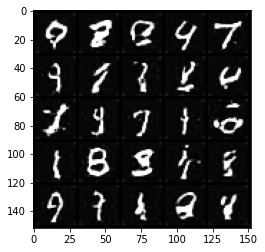

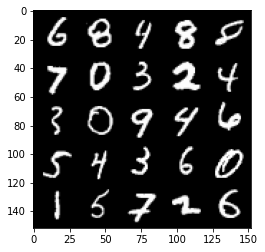

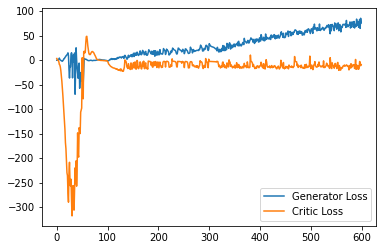

Epoch 26, step 12500: Generator loss: 75.49760260009765, critic loss: -12.371915986990931


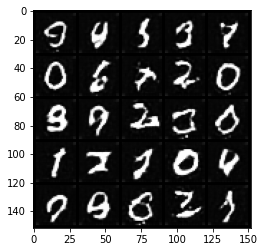

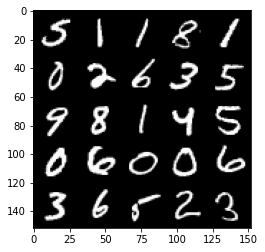

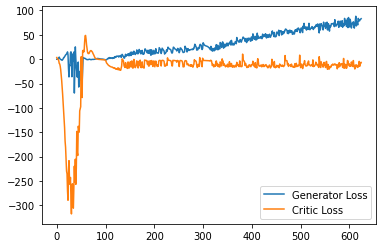

Epoch 27, step 13000: Generator loss: 79.18033882141113, critic loss: -10.54097882148623


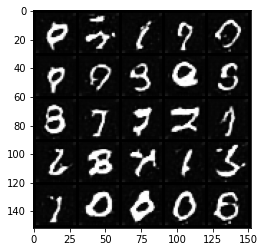

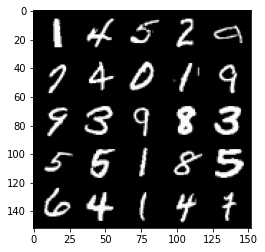

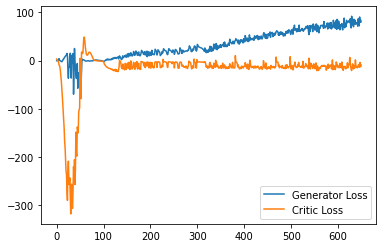

Epoch 28, step 13500: Generator loss: 79.29030324554444, critic loss: -9.280594268178948


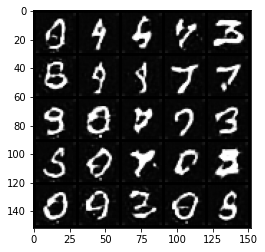

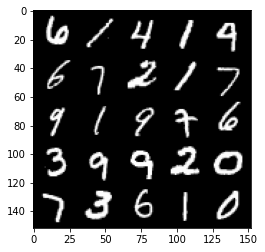

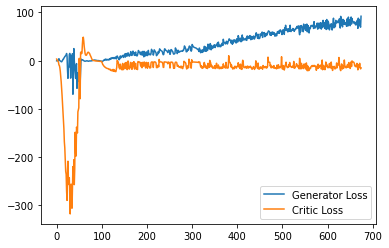

Epoch 29, step 14000: Generator loss: 79.8709661026001, critic loss: -11.353186741769317


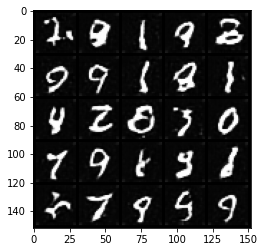

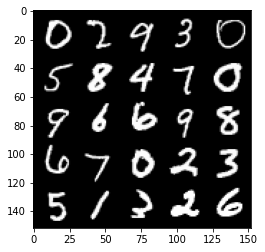

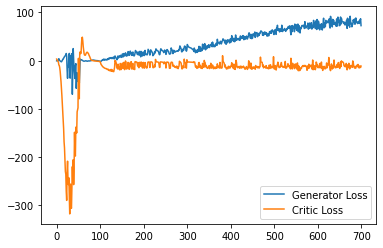

Epoch 30, step 14500: Generator loss: 80.46435947418213, critic loss: -12.214788221955288


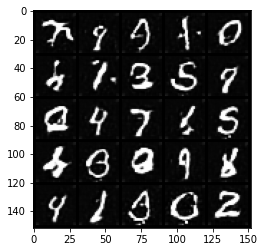

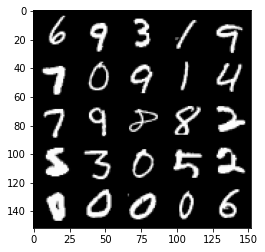

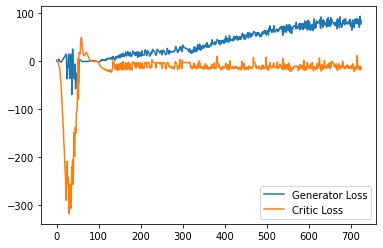

Epoch 31, step 15000: Generator loss: 80.91937809753418, critic loss: -12.173287232565878


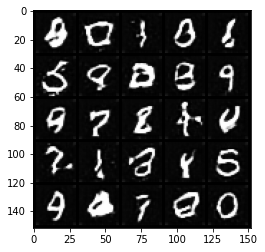

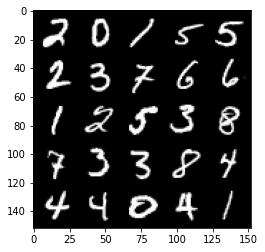

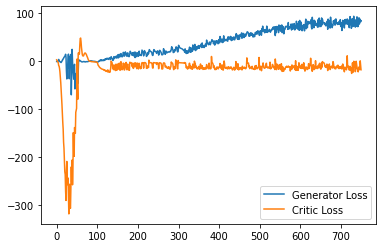

Epoch 33, step 15500: Generator loss: 81.7175143585205, critic loss: -10.883965281605716


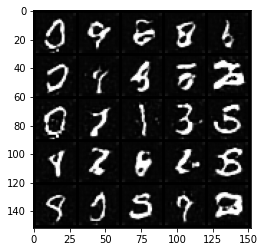

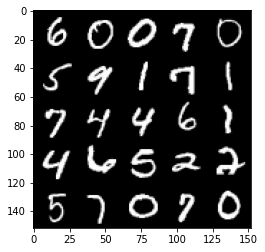

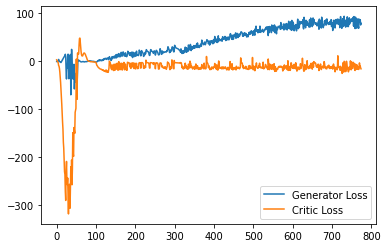

Epoch 34, step 16000: Generator loss: 81.93553535461426, critic loss: -14.922287794315812


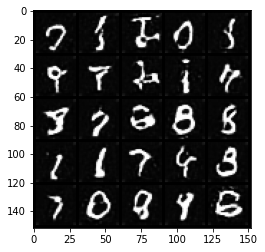

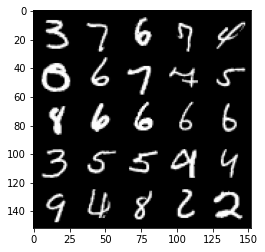

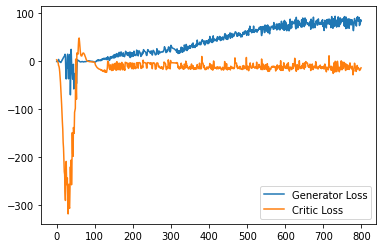

Epoch 35, step 16500: Generator loss: 85.97928448486329, critic loss: -12.760023423385617


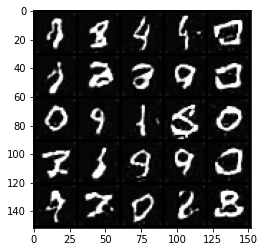

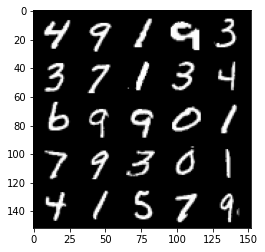

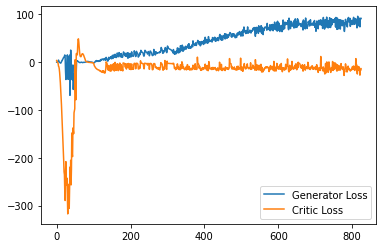

Epoch 36, step 17000: Generator loss: 86.83103926086426, critic loss: -12.386339913582805


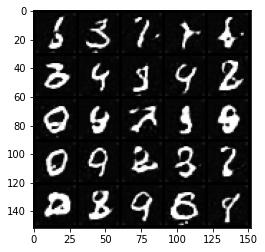

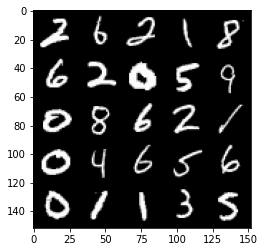

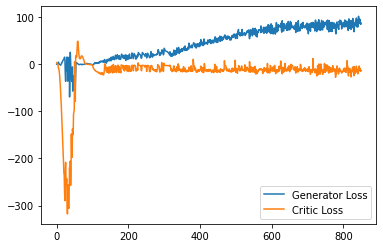

Epoch 37, step 17500: Generator loss: 91.28567887115479, critic loss: -10.10130665714741


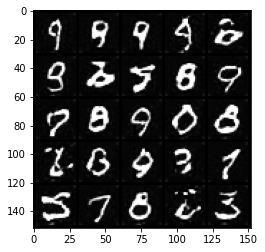

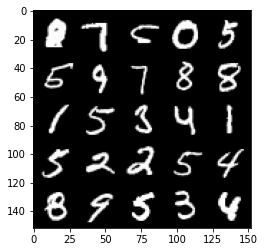

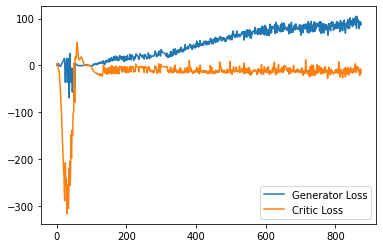

Epoch 38, step 18000: Generator loss: 90.46305146026612, critic loss: -11.41249243326783


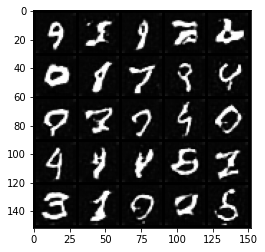

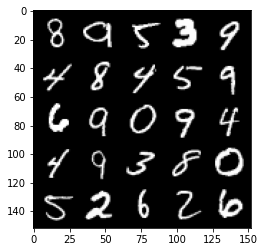

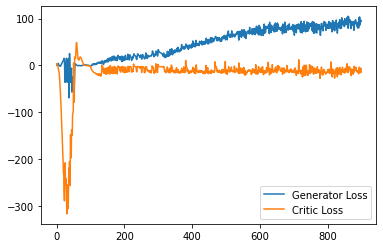

Epoch 39, step 18500: Generator loss: 93.16444355010987, critic loss: -12.839782878303529


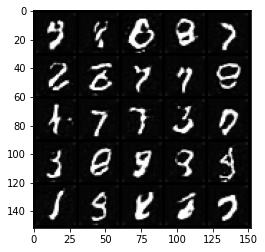

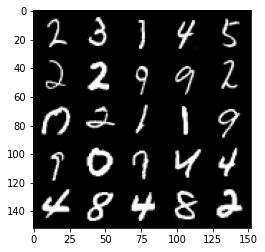

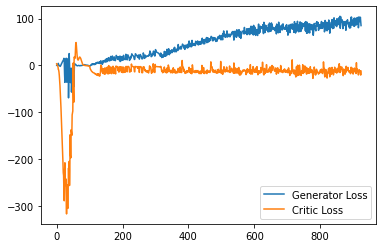

Epoch 40, step 19000: Generator loss: 95.13747204589843, critic loss: -15.084993862891205


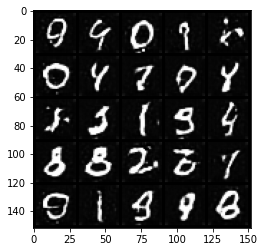

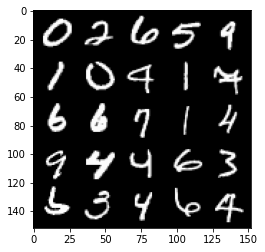

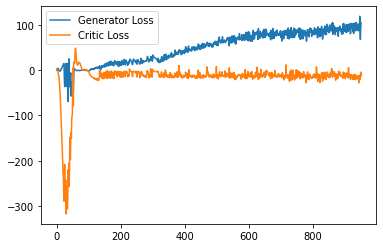

Epoch 41, step 19500: Generator loss: 98.97391112518311, critic loss: -12.490386001110062


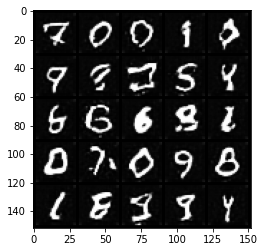

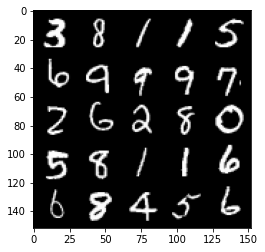

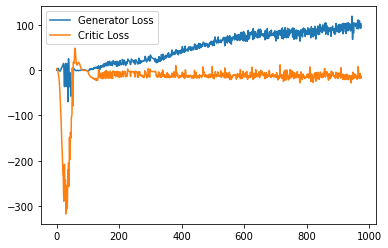

Epoch 42, step 20000: Generator loss: 102.69397874450684, critic loss: -11.004684461164473


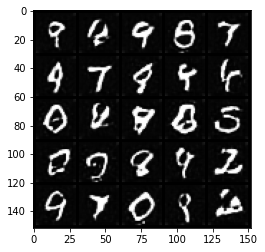

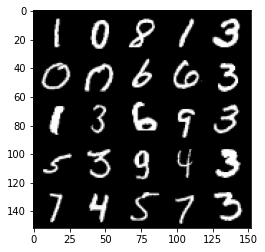

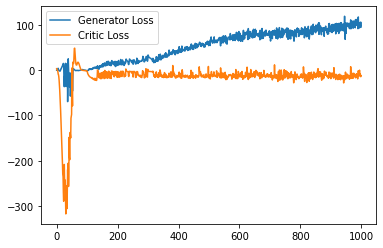

Epoch 43, step 20500: Generator loss: 101.48733436584473, critic loss: -10.239215239608296


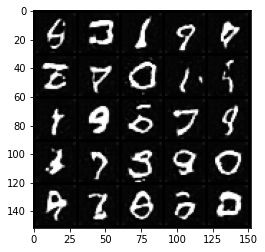

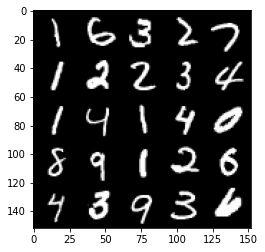

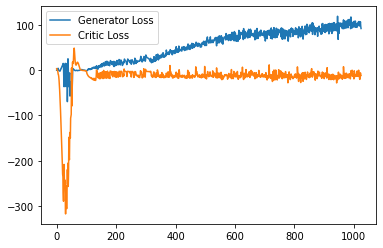

Epoch 44, step 21000: Generator loss: 99.82623773193359, critic loss: -13.183175157171485


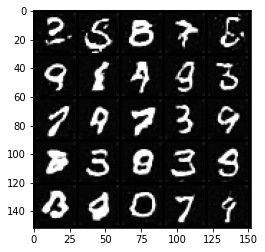

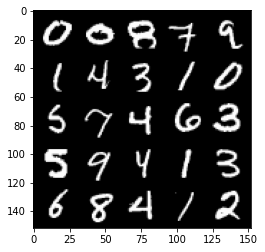

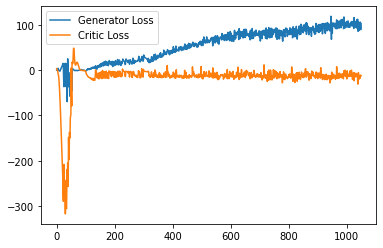

Epoch 45, step 21500: Generator loss: 96.09934680557251, critic loss: -12.703568765735612


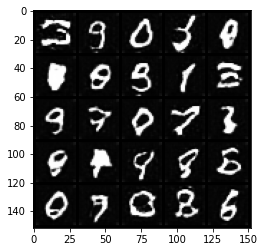

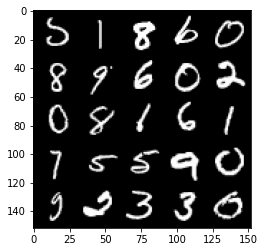

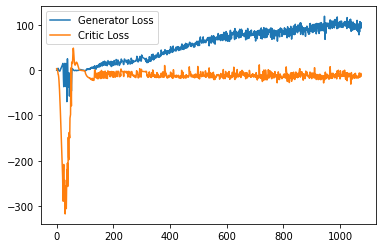

Epoch 46, step 22000: Generator loss: 98.36936729431153, critic loss: -13.41163169012666


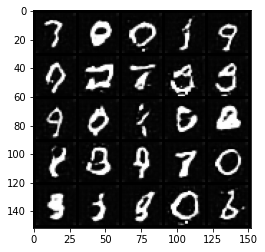

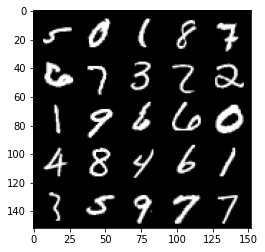

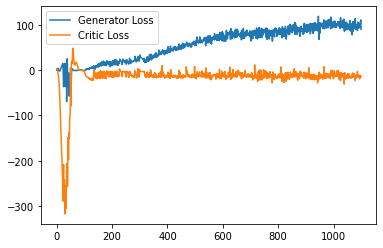

Epoch 47, step 22500: Generator loss: 103.97764543151855, critic loss: -11.620781080204257


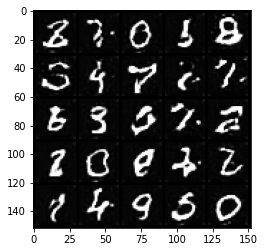

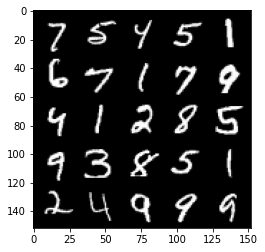

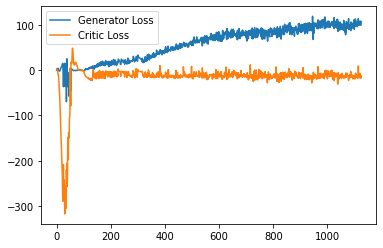

Epoch 49, step 23000: Generator loss: 104.71896718597412, critic loss: -11.341749394208193


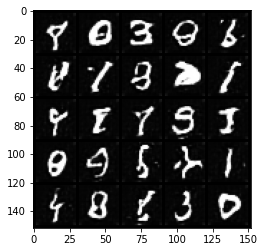

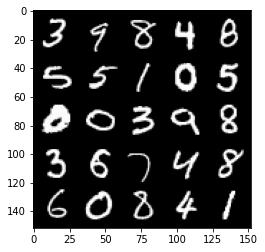

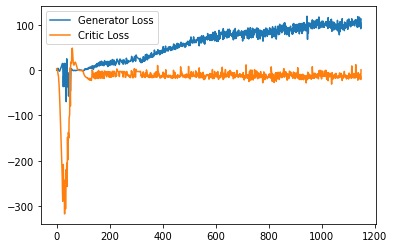

Epoch 50, step 23500: Generator loss: 104.11381311798095, critic loss: -13.596283940386773


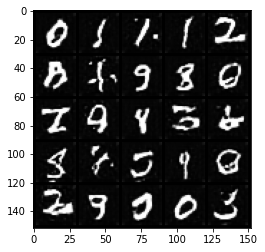

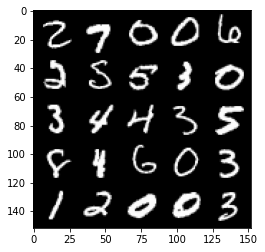

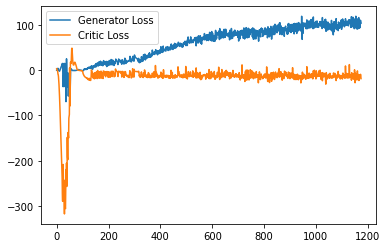

Epoch 51, step 24000: Generator loss: 104.36855947875976, critic loss: -10.284567491340646


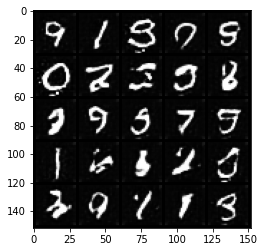

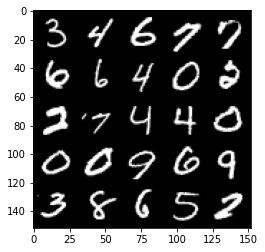

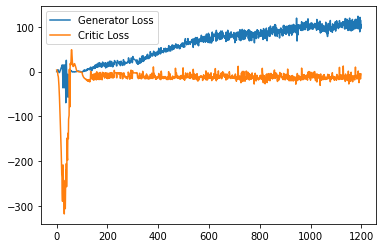

Epoch 52, step 24500: Generator loss: 101.55427188110352, critic loss: -14.622172654247287


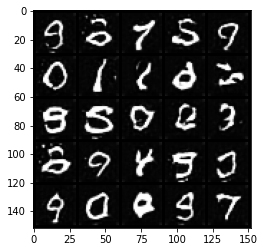

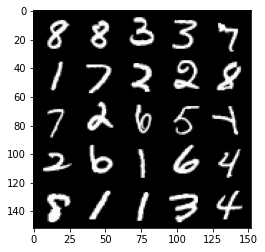

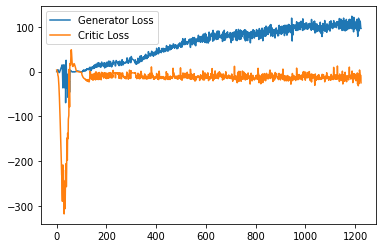

Epoch 53, step 25000: Generator loss: 106.37325862121583, critic loss: -1.968035165047645


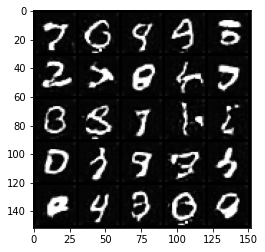

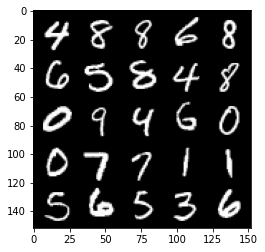

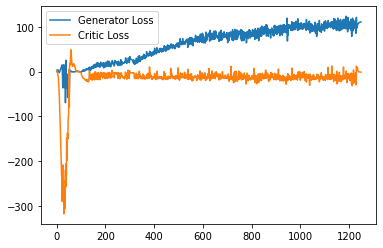

Epoch 54, step 25500: Generator loss: 113.05319958496094, critic loss: -1.8835230917692178


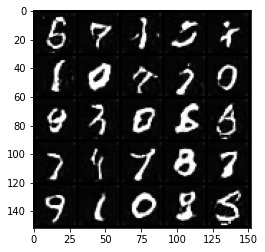

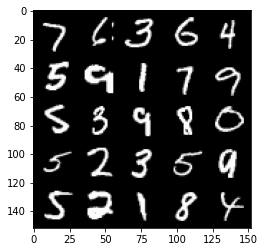

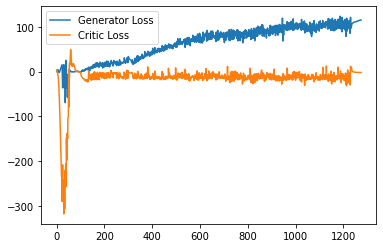

Epoch 55, step 26000: Generator loss: 116.93992680358886, critic loss: -2.2820021001338957


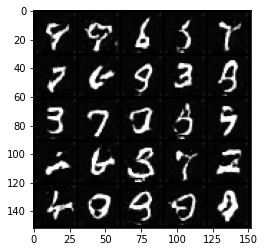

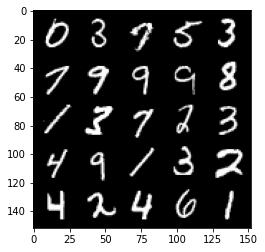

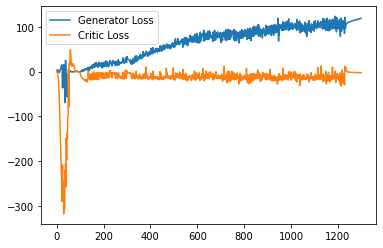

Epoch 56, step 26500: Generator loss: 120.95835389709472, critic loss: -2.576860784626006


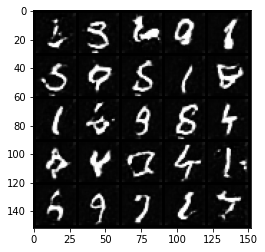

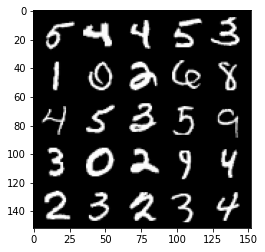

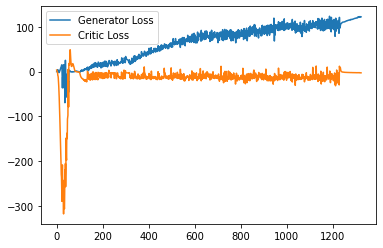

Epoch 57, step 27000: Generator loss: 124.54770733642579, critic loss: -2.930440187406539


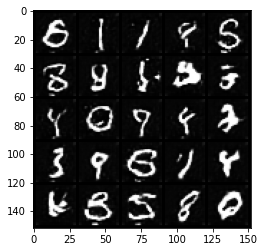

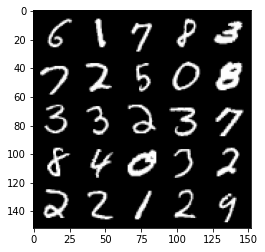

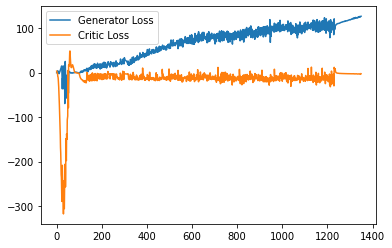

Epoch 58, step 27500: Generator loss: 129.78607106018066, critic loss: -3.509275746381283


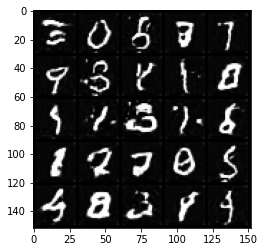

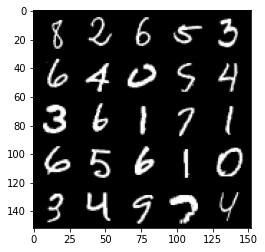

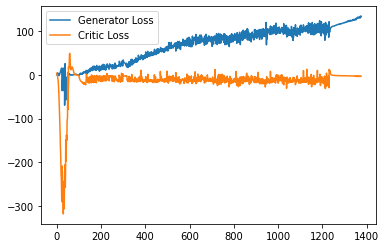

Epoch 59, step 28000: Generator loss: 131.05223527526854, critic loss: -3.670486357706786


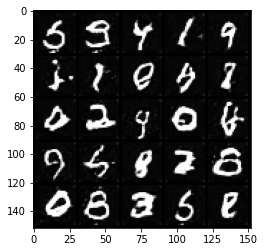

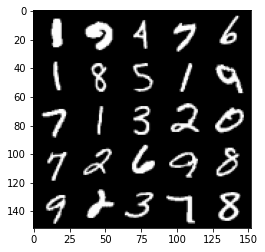

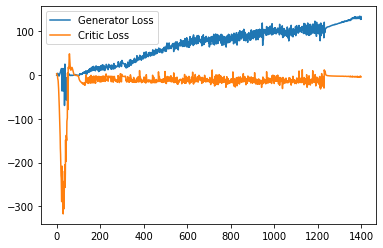

Epoch 60, step 28500: Generator loss: 130.2710118560791, critic loss: -3.989334652262928


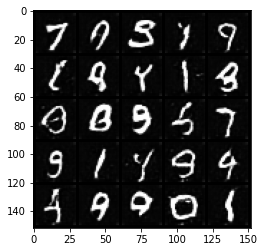

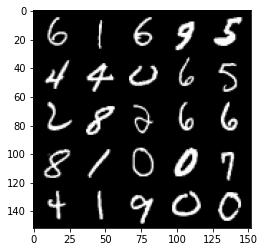

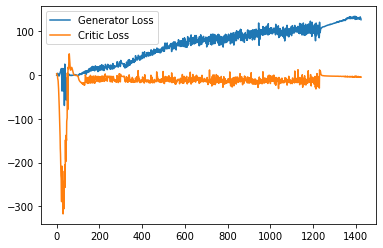

Epoch 61, step 29000: Generator loss: 130.28955572509764, critic loss: -4.313470452839133


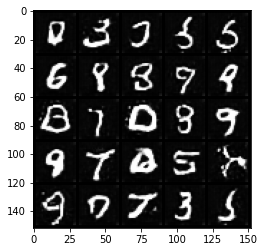

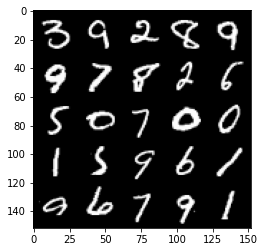

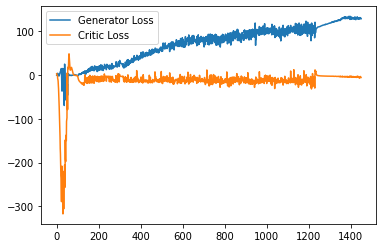

Epoch 62, step 29500: Generator loss: 130.03784533691407, critic loss: -4.522947050237652


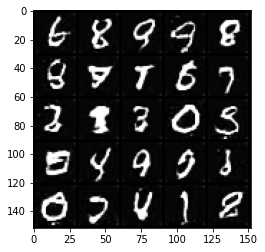

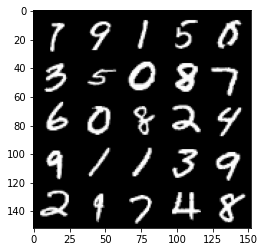

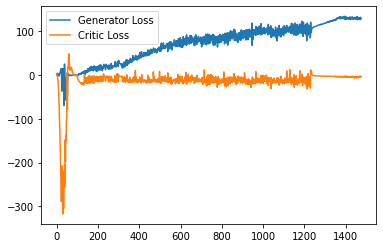

Epoch 63, step 30000: Generator loss: 126.65993269348145, critic loss: -5.430525954961773


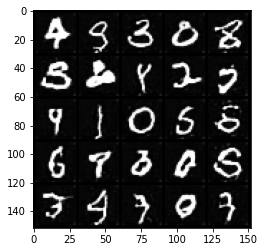

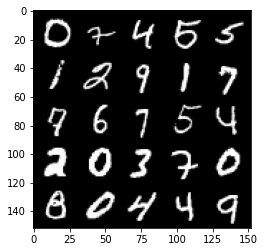

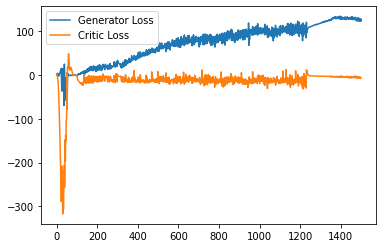

Epoch 65, step 30500: Generator loss: 125.94827168273926, critic loss: -5.432523910146948


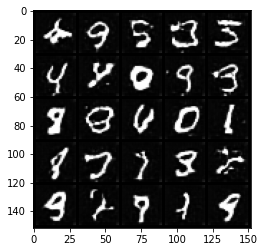

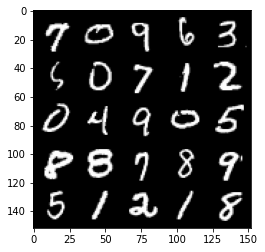

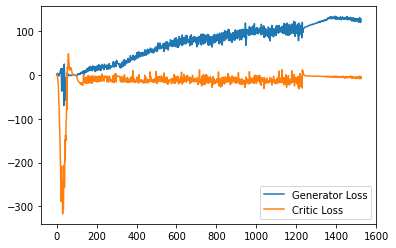

Epoch 66, step 31000: Generator loss: 124.94196435546876, critic loss: -5.1566209860682495


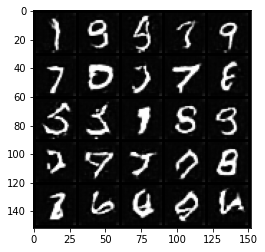

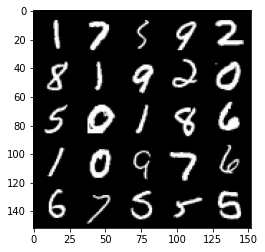

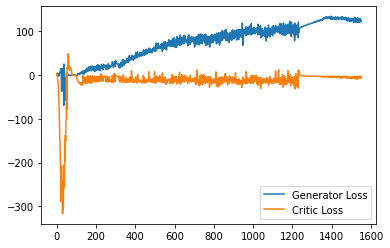

Epoch 67, step 31500: Generator loss: 124.29966851806641, critic loss: -5.638958588469024


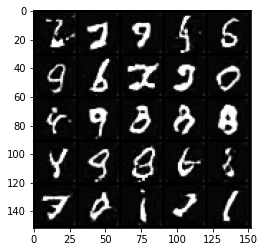

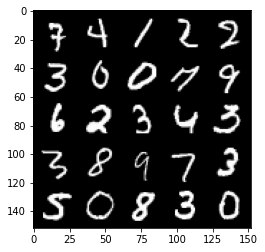

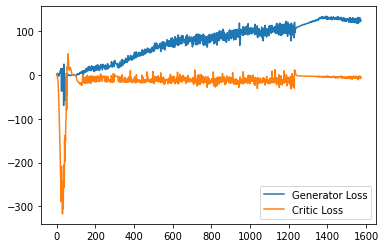

Epoch 68, step 32000: Generator loss: 124.34489024353027, critic loss: -5.933994471859927


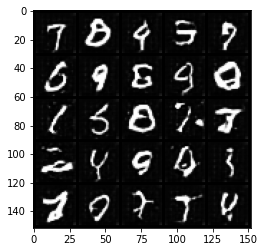

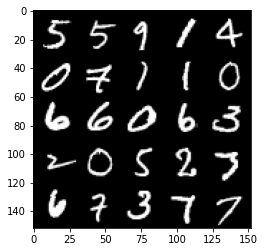

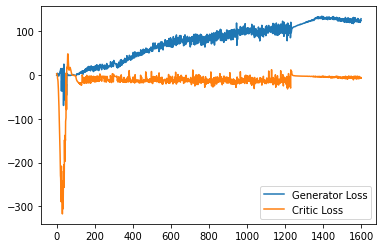

Epoch 69, step 32500: Generator loss: 121.17762951660156, critic loss: -7.013814794212576


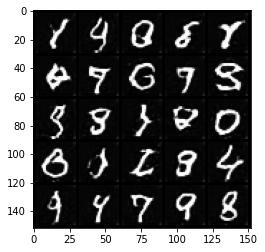

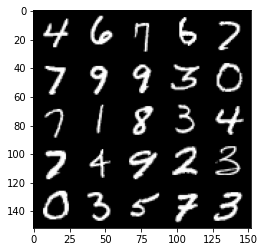

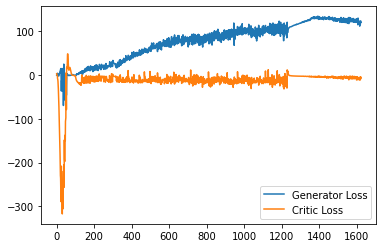

Epoch 70, step 33000: Generator loss: 121.34085331726074, critic loss: -7.152527409267424


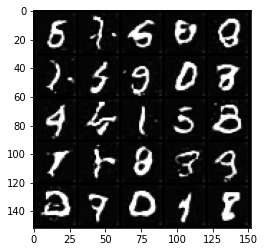

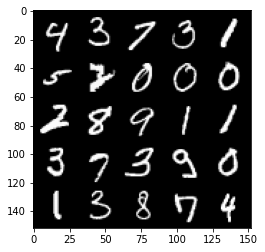

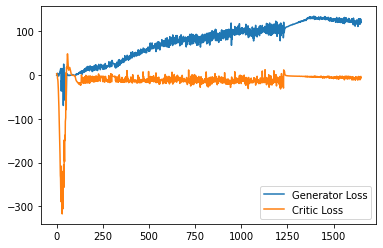

Epoch 71, step 33500: Generator loss: 120.81622273254395, critic loss: -8.402957217735054


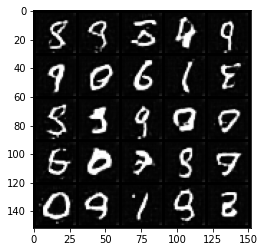

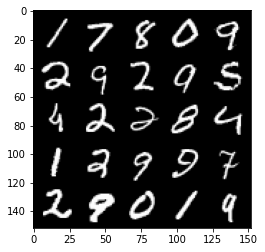

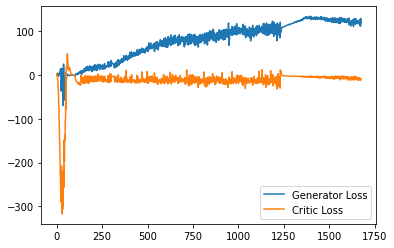

Epoch 72, step 34000: Generator loss: 121.36544076538085, critic loss: -8.38975678400397


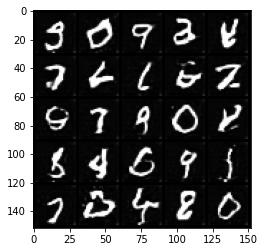

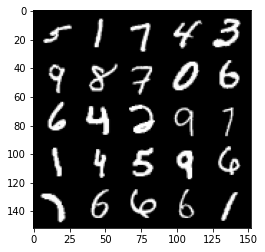

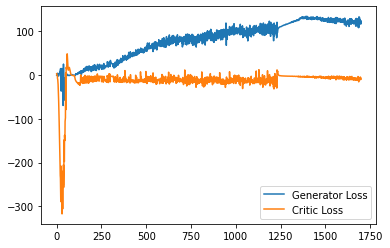

Epoch 73, step 34500: Generator loss: 122.26100257873536, critic loss: -8.382773124331239


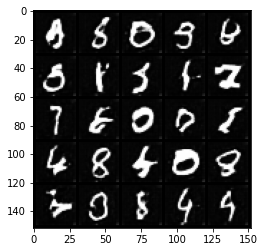

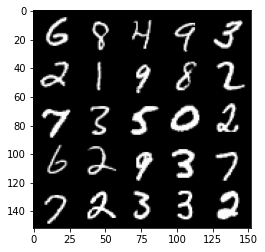

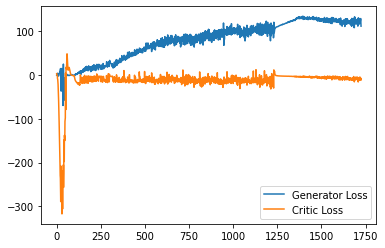

Epoch 74, step 35000: Generator loss: 123.33810443115235, critic loss: -9.603582926404487


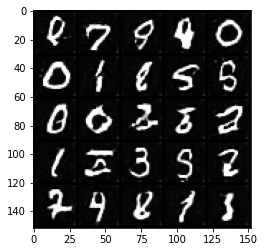

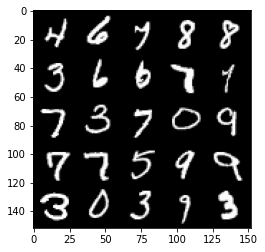

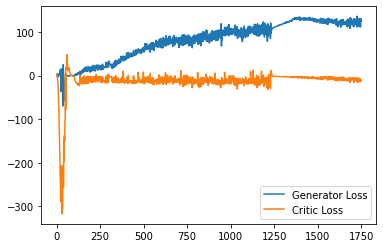

Epoch 75, step 35500: Generator loss: 122.9588671875, critic loss: -9.655319957005984


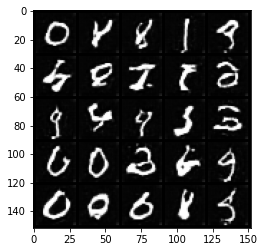

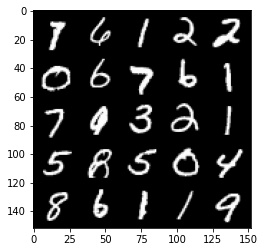

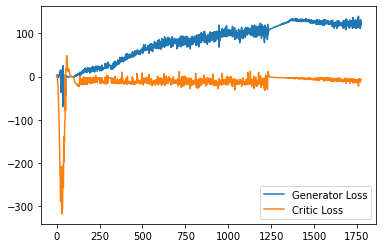

Epoch 76, step 36000: Generator loss: 123.69332217407226, critic loss: -11.63607230408191


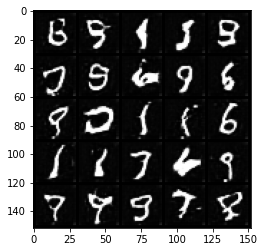

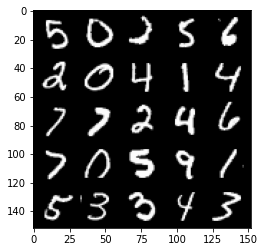

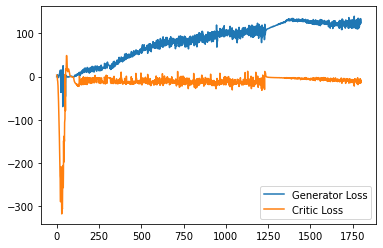

Epoch 77, step 36500: Generator loss: 124.74261166381837, critic loss: -12.183911620819558


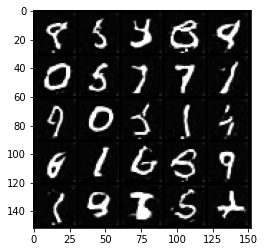

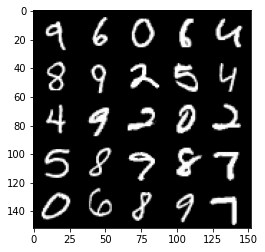

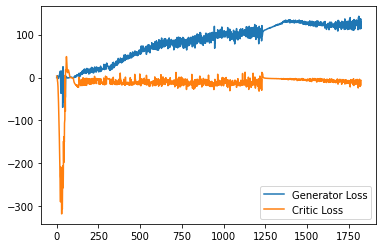

Epoch 78, step 37000: Generator loss: 124.36112705993652, critic loss: -9.121777822518348


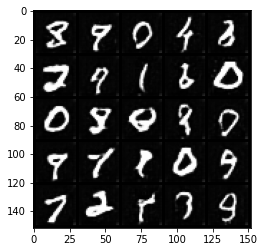

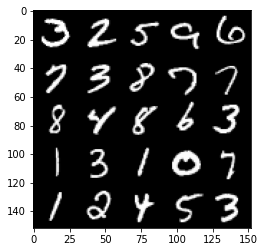

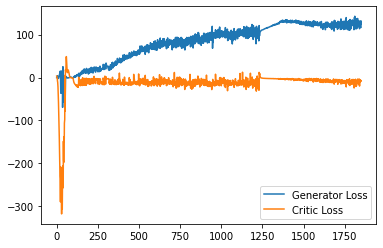

Epoch 79, step 37500: Generator loss: 126.84528413391114, critic loss: -8.958696147370336


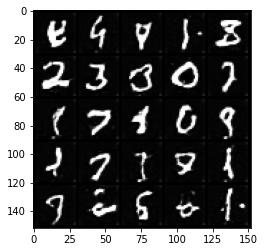

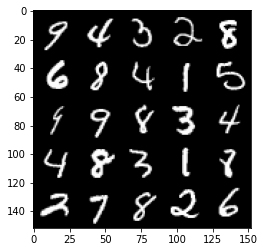

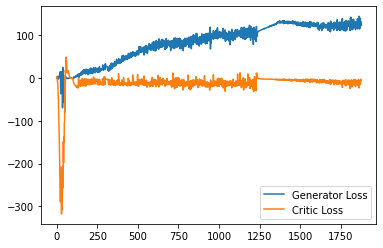

Epoch 81, step 38000: Generator loss: 124.1797170715332, critic loss: -8.778652596718068


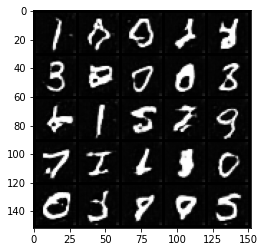

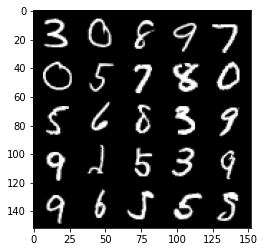

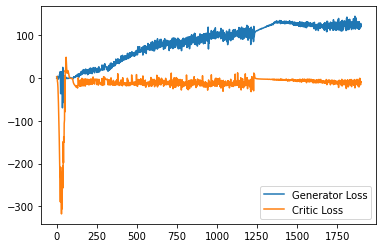

Epoch 82, step 38500: Generator loss: 125.16073675537109, critic loss: -9.951769159173962


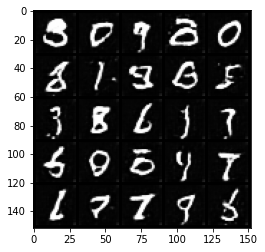

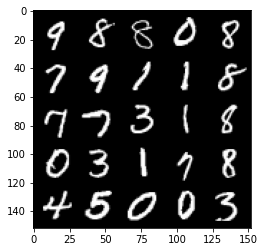

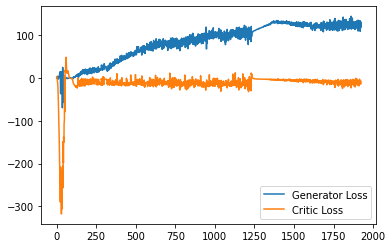

Epoch 83, step 39000: Generator loss: 126.30179852294921, critic loss: -8.343533979856966


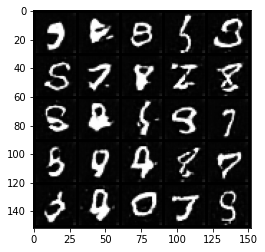

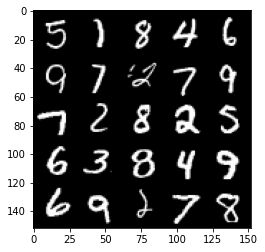

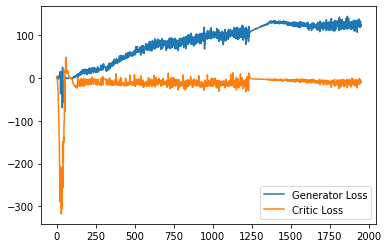

Epoch 84, step 39500: Generator loss: 125.80732717895508, critic loss: -10.326955499923228


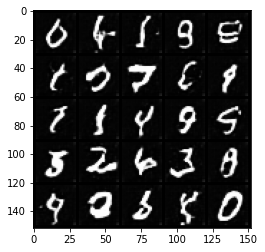

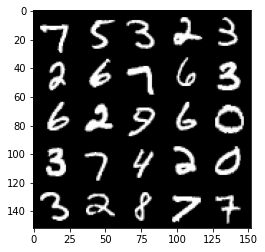

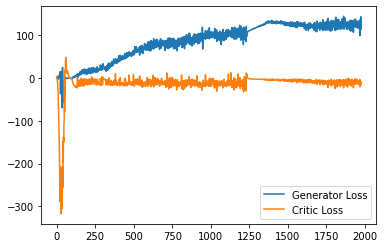

Epoch 85, step 40000: Generator loss: 125.86830114746094, critic loss: -9.890409287345406


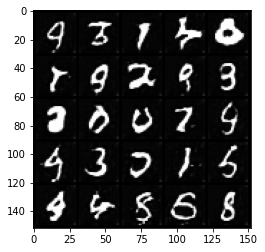

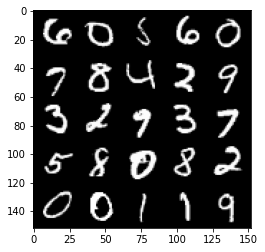

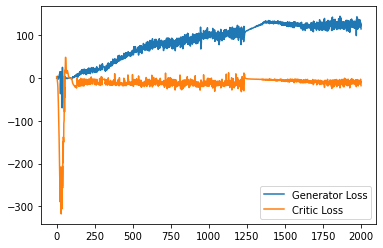

Epoch 86, step 40500: Generator loss: 127.2723491821289, critic loss: -11.806901444172842


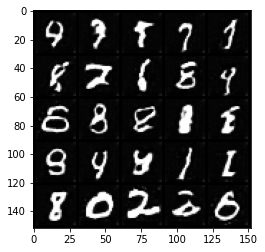

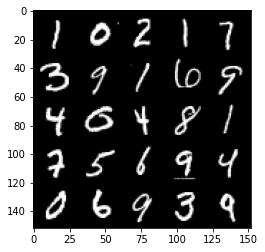

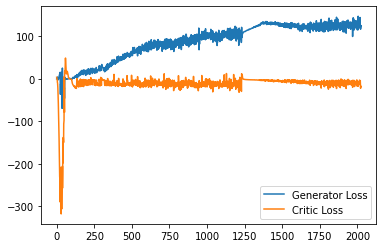

Epoch 87, step 41000: Generator loss: 130.91768148803712, critic loss: -9.538448692405215


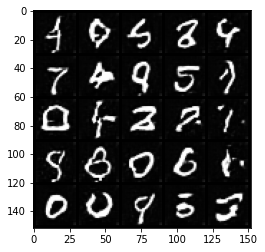

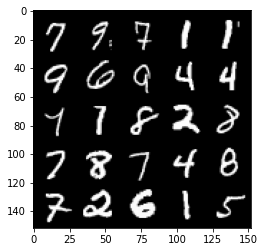

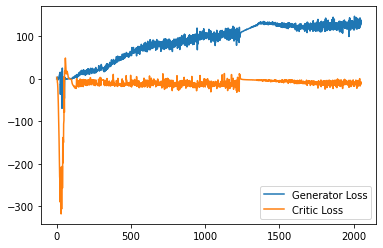

Epoch 88, step 41500: Generator loss: 131.72429946899413, critic loss: -10.900390871894354


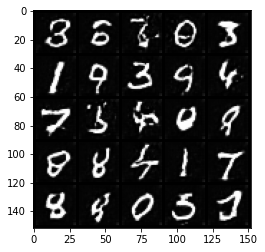

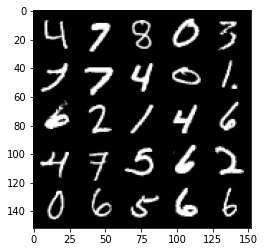

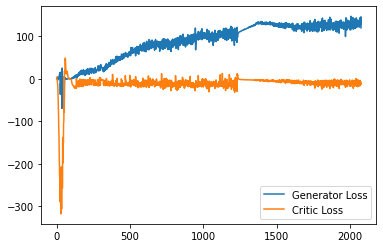

Epoch 89, step 42000: Generator loss: 131.08291232299806, critic loss: -9.8715292796731


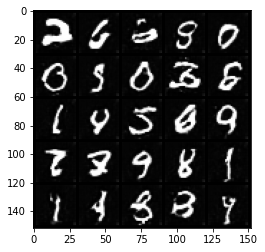

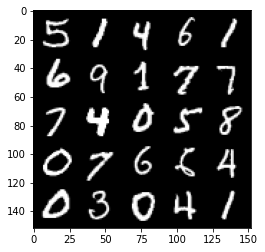

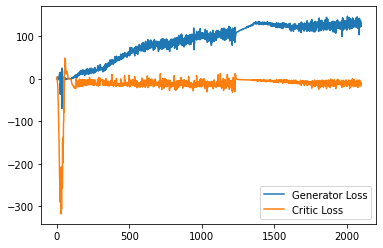

Epoch 90, step 42500: Generator loss: 130.02549182128905, critic loss: -11.214710016465173


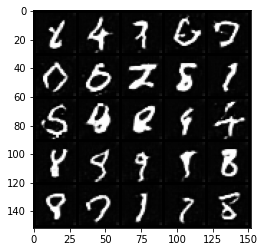

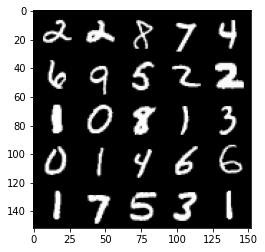

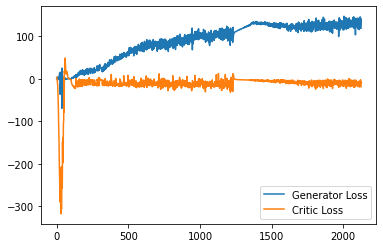

Epoch 91, step 43000: Generator loss: 132.17544424438478, critic loss: -12.357433290767675


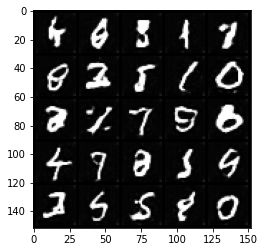

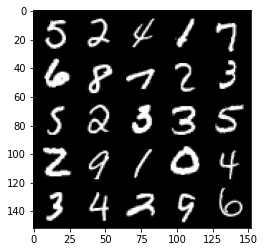

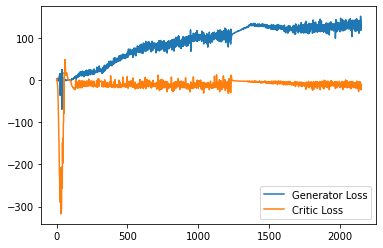

Epoch 92, step 43500: Generator loss: 133.34219554138184, critic loss: -10.826985145735751


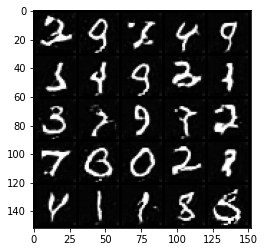

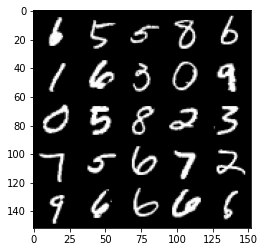

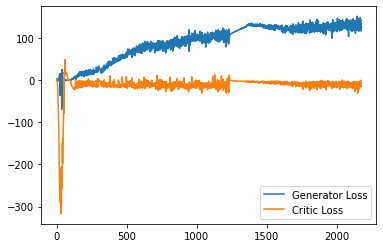

Epoch 93, step 44000: Generator loss: 129.45027293395995, critic loss: -12.535652311503888


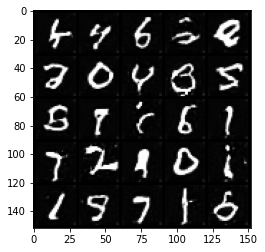

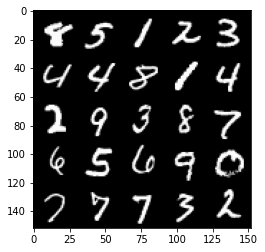

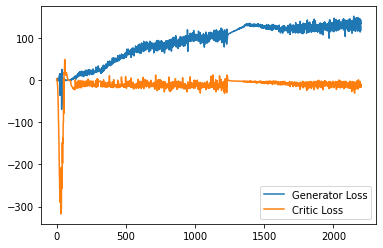

Epoch 94, step 44500: Generator loss: 131.09973670959474, critic loss: -9.770129276269685


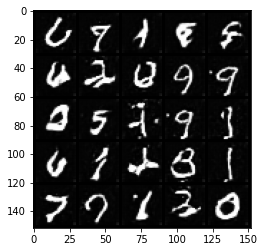

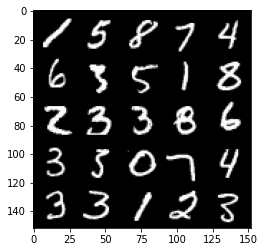

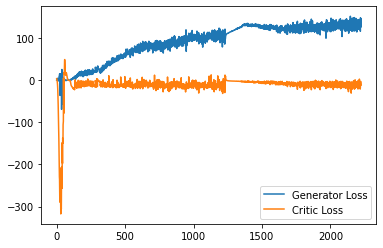

Epoch 95, step 45000: Generator loss: 128.84860693359374, critic loss: -11.951891466236123


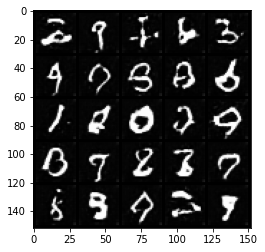

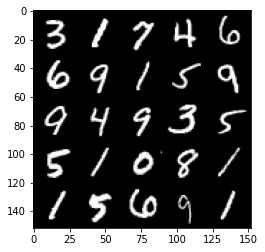

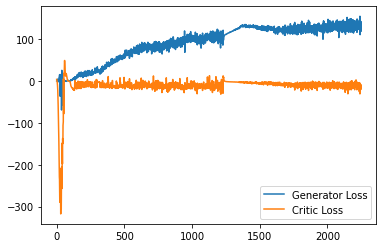

Epoch 97, step 45500: Generator loss: 127.77333280944825, critic loss: -11.976448517560982


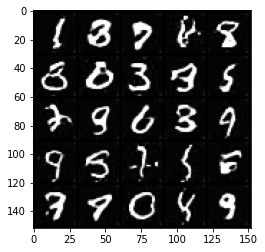

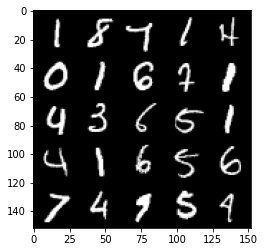

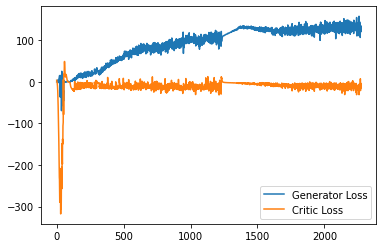

Epoch 98, step 46000: Generator loss: 129.09495553588866, critic loss: -12.54761444002987


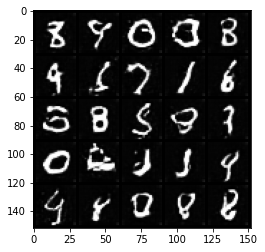

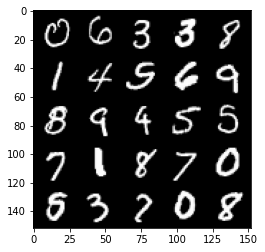

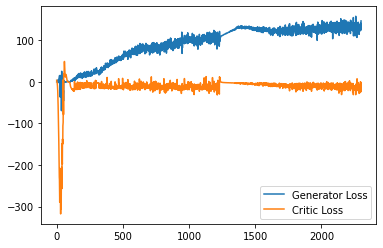

Epoch 99, step 46500: Generator loss: 129.41894577789307, critic loss: -11.601071937054408


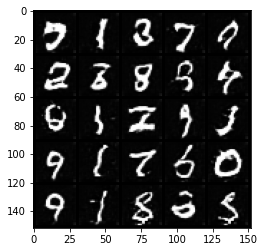

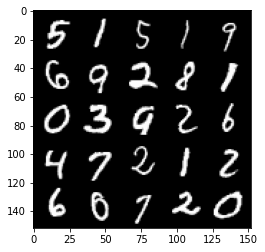

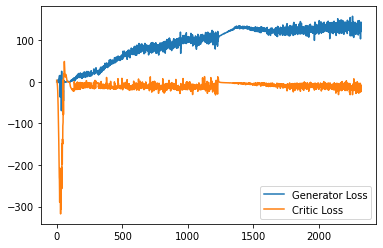

In [16]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
